# Test Inference Steps

In [6]:
from diffusers import StableDiffusionPipeline
from utils import image_grid
import torch

In [7]:
weights_folder_name = "shane8"
finetuned_model = "./models/shane/stable_diffusion_weights/" + weights_folder_name
no_imgs = 10
num_inference_steps = 25 #[1, 2, 5, 10, 15, 25, 40, 50, 60, 75, 80, 90, 100]
guidance_scale = 30
#cols = no_imgs // 2 if no_imgs // 2 <= 5 else 5
#rows = no_imgs // cols if no_imgs // cols % 2 == 0 else no_imgs // cols + 1

In [8]:
pipe = StableDiffusionPipeline.from_pretrained(finetuned_model, torch_dtype=torch.float16).to("cuda")

In [13]:
prompt = "a portrait photo of a shane man, handsome, photograph, photorealistic, hard rim lighting photography--beta --ar 2:3  --beta --upbeta, well lit"
n_prompt = "bad, deformed, ugly, bad anatomy, cartoon, animated, scary, wrinkles, duplicate, double"
image = [0] * no_imgs
for i in range(no_imgs):
#for i, val in enumerate(num_inference_steps):
    #generator = torch.Generator("cuda").manual_seed(60)
    image[i] = pipe(prompt, negative_prompt=n_prompt, num_inference_steps=num_inference_steps, guidance_scale=guidance_scale).images[0]

100%|██████████| 25/25 [00:05<00:00,  4.86it/s]


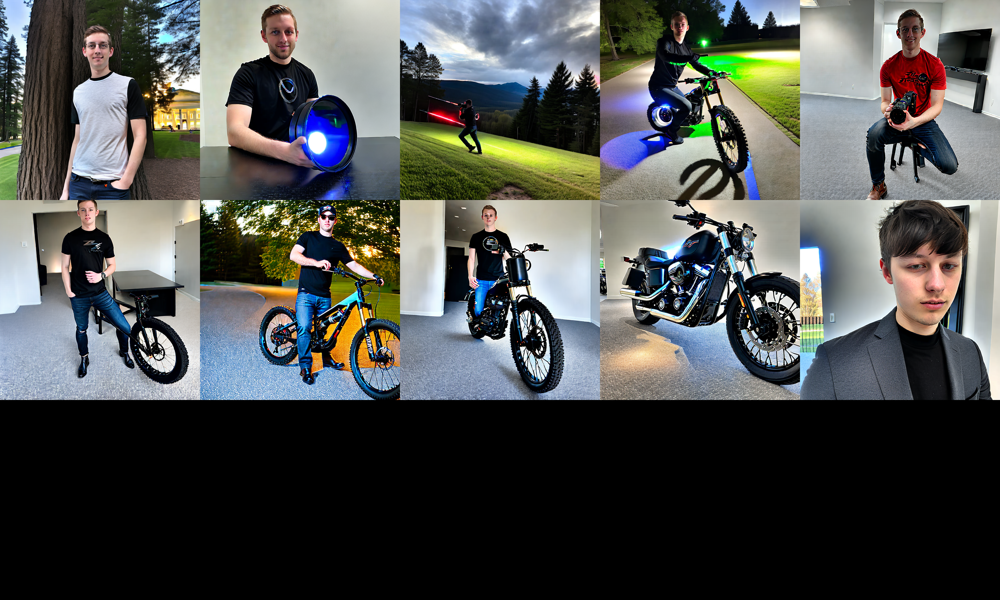

In [14]:
image_grid(image, rows=3, cols=5)

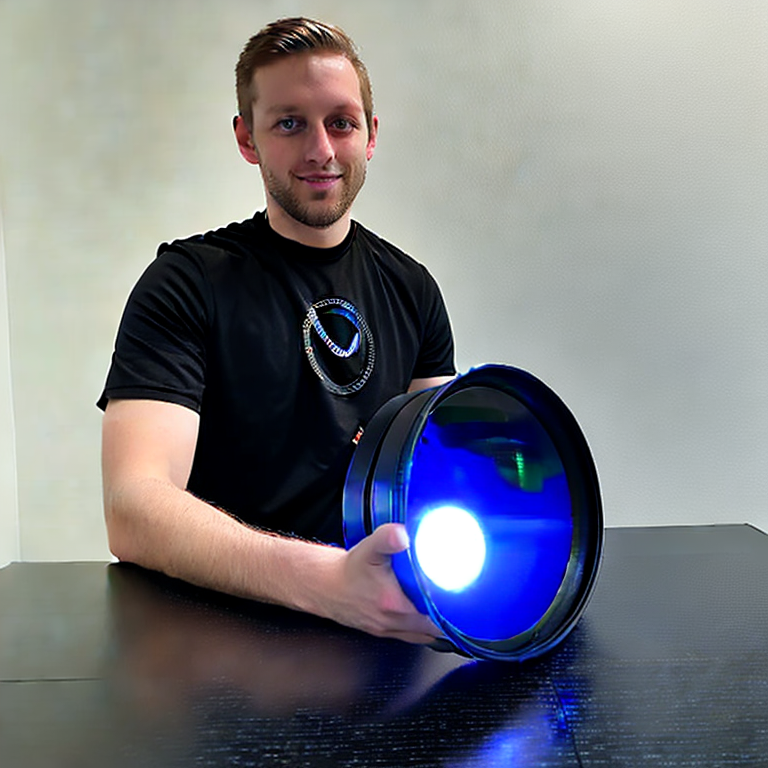

In [15]:
image[1]